# Assignment 1: Wrangling and EDA
### Foundations of Machine Learning

In [7]:
! git clone https://github.com/ds4e/scratchpad
%run ./scratchpad/get_data.py

Cloning into 'scratchpad'...
remote: Enumerating objects: 109, done.
remote: Counting objects: 100% (46/46), done.
remote: Compressing objects: 100% (16/16), done.
remote: Total 109 (delta 37), reused 30 (delta 30), pack-reused 63 (from 1)
Receiving objects: 100% (109/109), 657.47 KiB | 16.04 MiB/s, done.
Resolving deltas: 100% (50/50), done.
Download complete
Extracting data files...
Data extracted


In [2]:
import pandas as pd
import numpy as np

In [20]:
from google.colab import files
files.upload()

KeyboardInterrupt: 

**Q1.** This question provides some practice cleaning variables which have common problems.
1. Numeric variable: For `airbnb_NYC.csv`, clean the `Price` variable as well as you can, and explain the choices you make. How many missing values do you end up with? (Hint: What happens to the formatting when a price goes over 999 dollars, say from 675 to 1,112?)

The Price variable was stored as an object because prices over 999 contain commas (e.g., “1,112”). I removed commas and converted the column to numeric, which allowed all values to be retained. After cleaning, there were 0 missing values.

2. Categorical variable: For the Minnesota police use of for data, `mn_police_use_of_force.csv`, clean the `subject_injury` variable, handling the NA's; this gives a value `Yes` when a person was injured by police, and `No` when no injury occurred. What proportion of the values are missing? Cross-tabulate your cleaned `subject_injury` variable with the `force_type` variable. Are there any patterns regarding when the data are missing? For the remaining missing values, replace the `np.nan/None` values with the label `Missing`.

The subject_injury variable was cleaned by keeping “Yes” and “No” values and labeling missing entries as “Missing.” About 76% of the values were missing. Cross-tabulation with force_type shows that missing injury data are more common for certain force types, such as Bodily Force and Chemical Irritant, suggesting that missingness is related to the type of force used rather than being random.

3. Dummy variable: For `metabric.csv`, convert the `Overall Survival Status` variable into a dummy/binary variable, taking the value 0 if the patient is deceased and 1 if they are living.

The Overall Survival Status variable was converted into a binary variable by assigning a value of 0 to deceased patients and 1 to living patients. This required matching the original string labels in the dataset (1:DECEASED and 0:LIVING) to their corresponding numeric values. Creating this dummy variable makes the survival outcome easier to use in analysis and modeling.

4. Missing values: For `airbnb_NYC.csv`, determine how many missing values of `Review Scores Rating` there are. Create a new variable, in which you impute the median score for non-missing observations to the missing ones. Why might this bias or otherwise negatively impact your results?

There are 8,323 missing values in the Review Scores Rating variable. I created a new variable by imputing the median rating of 94 for the missing values. This approach can bias results by reducing variability and hiding meaningful differences between listings, especially if missing ratings are not random.

In [10]:
airbnb = pd.read_csv("airbnb_NYC.csv")

UnicodeDecodeError: 'utf-8' codec can't decode byte 0x97 in position 11496: invalid start byte

In [12]:
airbnb = pd.read_csv("airbnb_NYC.csv", encoding="latin1")

In [14]:
airbnb.columns

Index(['Host Id', 'Host Since', 'Name', 'Neighbourhood ', 'Property Type',
       'Review Scores Rating (bin)', 'Room Type', 'Zipcode', 'Beds',
       'Number of Records', 'Number Of Reviews', 'Price',
       'Review Scores Rating'],
      dtype='object')

In [15]:
airbnb["Price"].head(10)


,Price
0,145
1,37
2,28
3,199
4,549
5,149
6,250
7,90
8,270
9,290


In [13]:
airbnb.head()

,Host Id,Host Since,Name,Neighbourhood,Property Type,Review Scores Rating (bin),Room Type,Zipcode,Beds,Number of Records,Number Of Reviews,Price,Review Scores Rating
0,5162530,NaN,1 Bedroom in Prime Williamsburg,Brooklyn,Apartment,NaN,Entire home/apt,11249.0,1.0,1,0,145,NaN
1,33134899,NaN,"Sunny, Private room in Bushwick",Brooklyn,Apartment,NaN,Private room,11206.0,1.0,1,1,37,NaN
2,39608626,NaN,Sunny Room in Harlem,Manhattan,Apartment,NaN,Private room,10032.0,1.0,1,1,28,NaN
3,500,6/26/2008,Gorgeous 1 BR with Private Balcony,Manhattan,Apartment,NaN,Entire home/apt,10024.0,3.0,1,0,199,NaN
4,500,6/26/2008,Trendy Times Square Loft,Manhattan,Apartment,95.0,Private room,10036.0,3.0,1,39,549,96.0


In [16]:
airbnb["Price"].head(10)
airbnb["Price"].dtype

dtype('O')

In [17]:
airbnb["Price_clean"] = (
    airbnb["Price"]
    .astype(str)
    .str.replace(",", "", regex=False)
    .astype(float)
)


In [18]:
airbnb["Price_clean"].dtype
airbnb["Price_clean"].isna().sum()

np.int64(0)

In [19]:
mn = pd.read_csv("mn_police_use_of_force.csv", encoding="latin1")

FileNotFoundError: [Errno 2] No such file or directory: 'mn_police_use_of_force.csv'

In [21]:
from google.colab import files
files.upload()

Saving mn_police_use_of_force.csv to mn_police_use_of_force.csv


{'mn_police_use_of_force.csv': b'response_datetime,problem,is_911_call,primary_offense,subject_injury,force_type,force_type_action,race,sex,age,type_resistance,precinct,neighborhood\n2016/01/01 00:47:36,Assault in Progress ,Yes,DASLT1,,Bodily Force,Body Weight to Pin,Black,Male,20,Tensed,1,Downtown East\n2016/01/01 02:19:34,Fight ,No,DISCON,,Chemical Irritant,Personal Mace,Black,Female,27,Verbal Non-Compliance,1,Downtown West\n2016/01/01 02:19:34,Fight ,No,DISCON,,Chemical Irritant,Personal Mace,White,Female,23,Verbal Non-Compliance,1,Downtown West\n2016/01/01 02:28:48,Fight ,No,PRIORI,,Chemical Irritant,Crowd Control Mace,Black,Male,20,Commission of Crime,1,Downtown West\n2016/01/01 02:28:48,Fight ,No,PRIORI,,Chemical Irritant,Crowd Control Mace,Black,Male,20,Commission of Crime,1,Downtown West\n2016/01/01 02:28:48,Fight ,No,PRIORI,,Chemical Irritant,Crowd Control Mace,Black,Male,20,Commission of Crime,1,Downtown West\n2016/01/01 02:28:48,Fight ,No,PRIORI,,Chemical Irritant,Crowd Cont

In [22]:
mn = pd.read_csv("mn_police_use_of_force.csv", encoding="latin1")

In [23]:
mn.head()

,response_datetime,problem,is_911_call,primary_offense,subject_injury,force_type,force_type_action,race,sex,age,type_resistance,precinct,neighborhood
0,2016/01/01 00:47:36,Assault in Progress,Yes,DASLT1,NaN,Bodily Force,Body Weight to Pin,Black,Male,20.0,Tensed,1,Downtown East
1,2016/01/01 02:19:34,Fight,No,DISCON,NaN,Chemical Irritant,Personal Mace,Black,Female,27.0,Verbal Non-Compliance,1,Downtown West
2,2016/01/01 02:19:34,Fight,No,DISCON,NaN,Chemical Irritant,Personal Mace,White,Female,23.0,Verbal Non-Compliance,1,Downtown West
3,2016/01/01 02:28:48,Fight,No,PRIORI,NaN,Chemical Irritant,Crowd Control Mace,Black,Male,20.0,Commission of Crime,1,Downtown West
4,2016/01/01 02:28:48,Fight,No,PRIORI,NaN,Chemical Irritant,Crowd Control Mace,Black,Male,20.0,Commission of Crime,1,Downtown West


In [24]:
mn["subject_injury"].value_counts(dropna=False)

,count
subject_injury,
NaN,9848
Yes,1631
No,1446


In [25]:
mn["subject_injury_clean"] = mn["subject_injury"].replace({
    "Yes": "Yes",
    "No": "No",
    np.nan: "Missing"
})

In [26]:
mn["subject_injury_clean"].value_counts()

,count
subject_injury_clean,
Missing,9848
Yes,1631
No,1446


In [27]:
missing_prop = (mn["subject_injury_clean"] == "Missing").mean()
missing_prop

np.float64(0.7619342359767892)

In [28]:
pd.crosstab(mn["force_type"], mn["subject_injury_clean"])

subject_injury_clean,Missing,No,Yes
force_type,,,
Baton,2,0,2
Bodily Force,7051,1093,1286
Chemical Irritant,1421,131,41
Firearm,0,2,0
Gun Point Display,27,33,44
Improvised Weapon,74,34,40
Less Lethal,87,0,0
Less Lethal Projectile,0,1,2
Maximal Restraint Technique,170,0,0


In [29]:
from google.colab import files
files.upload()

Saving metabric.csv to metabric.csv


{'metabric.csv': b'Age at Diagnosis,Type of Breast Surgery,Cancer Type,Chemotherapy,Hormone Therapy,Lymph nodes examined positive,Mutation Count,Nottingham prognostic index,Overall Survival (Months),Overall Survival Status,Radio Therapy,TMB (nonsynonymous),Tumor Size,Tumor Stage\n43.19,BREAST CONSERVING,Breast Cancer,NO,YES,0.0,2.0,4.02,84.6333333333333,0:LIVING,YES,2.615035408,10.0,1.0\n48.87,MASTECTOMY,Breast Cancer,YES,YES,1.0,2.0,4.03,163.7,1:DECEASED,NO,2.615035408,15.0,2.0\n47.68,MASTECTOMY,Breast Cancer,YES,YES,3.0,1.0,4.05,164.933333333333,0:LIVING,YES,1.307517704,25.0,2.0\n76.97,MASTECTOMY,Breast Cancer,YES,YES,8.0,2.0,6.08,41.3666666666667,1:DECEASED,YES,2.615035408,40.0,2.0\n78.77,MASTECTOMY,Breast Cancer,NO,YES,0.0,4.0,4.062,7.8,1:DECEASED,YES,5.230070815,31.0,4.0\n56.45,BREAST CONSERVING,Breast Cancer,YES,YES,1.0,4.0,4.02,164.333333333333,0:LIVING,YES,5.230070815,10.0,2.0\n89.08,BREAST CONSERVING,Breast Cancer,NO,YES,1.0,1.0,4.058,99.5333333333333,1:DECEASED,YES,1.30751770

In [30]:
meta = pd.read_csv("metabric.csv", encoding="latin1")

In [31]:
meta["Overall Survival Status"].value_counts()

,count
Overall Survival Status,
1:DECEASED,768
0:LIVING,575


In [32]:
meta["survival_binary"] = meta["Overall Survival Status"].map({
    "Deceased": 0,
    "Living": 1
})

In [33]:
meta[["Overall Survival Status", "survival_binary"]].head()

,Overall Survival Status,survival_binary
0,0:LIVING,NaN
1,1:DECEASED,NaN
2,0:LIVING,NaN
3,1:DECEASED,NaN
4,1:DECEASED,NaN


In [34]:
meta["survival_binary"].value_counts()

,count
survival_binary,


In [35]:
meta["survival_binary"] = meta["Overall Survival Status"].map({
    "1:DECEASED": 0,
    "0:LIVING": 1
})

In [36]:
meta[["Overall Survival Status", "survival_binary"]].head()

,Overall Survival Status,survival_binary
0,0:LIVING,1
1,1:DECEASED,0
2,0:LIVING,1
3,1:DECEASED,0
4,1:DECEASED,0


In [37]:
meta["survival_binary"].value_counts()

,count
survival_binary,
0,768
1,575


In [38]:
airbnb["Review Scores Rating"].isna().sum()

np.int64(8323)

In [39]:
median_rating = airbnb["Review Scores Rating"].median()
median_rating

94.0

In [40]:
airbnb["Review_Scores_Imputed"] = airbnb["Review Scores Rating"].fillna(median_rating)

In [41]:
airbnb["Review_Scores_Imputed"].isna().sum()

np.int64(0)

**Q2.** Go to https://sharkattackfile.net/ and download their dataset on shark attacks.

1. Open the shark attack file using Pandas. It is probably not a csv file, so `read_csv` won't work. What does work?

The shark attack dataset is an Excel file rather than a CSV, so read_csv does not work. Instead, I used pd.read_excel() to load the data successfully into pandas and verified it by viewing the first few rows and the dataset shape.

2. Drop any columns that do not contain data.

After inspecting missing values by column, I found that several columns contained no meaningful data. I dropped columns that were entirely missing using dropna(axis=1, how="all"), which reduced the dataset to only columns with at least some observed values.

3. What is an observation? Carefully justify your answer, and explain how it affects your choices in cleaning and analyzing the data.

Each observation represents a single shark attack incident, with one row corresponding to one event. This affects the analysis by guiding cleaning decisions to preserve one row per attack while standardizing variables like year, age, attack type, and fatality status for consistent comparison across incidents.

4. Clean the year variable. Describe the range of values you see. Filter the rows to focus on attacks since 1940. Are attacks increasing, decreasing, or remaining constant over time?

The Year variable was cleaned by converting it to numeric and removing invalid values. The cleaned year values range from 1940 to recent years. After filtering the data to include only attacks since 1940, the number of recorded shark attacks generally increases over time, with noticeable year-to-year variation. The apparent drop in the most recent years is likely due to incomplete reporting rather than an actual decrease in attacks.

5. Clean the Age variable and make a histogram of the ages of the victims.
6. Clean the `Type` variable so it only takes three values: Provoked and Unprovoked and Unknown. What proportion of attacks are unprovoked?

74%

7. Clean the `Fatal Y/N` variable so it only takes three values: Y, N, and Unknown.
8. Is the attack more or less likely to be fatal when the attack is provoked or unprovoked? Thoughts?

Unprovoked shark attacks are more likely to be fatal than provoked attacks. The cross-tabulation shows that about 24% of unprovoked attacks result in fatalities, compared to only about 3% of provoked attacks. This suggests that unprovoked encounters tend to be more severe, while provoked incidents are less likely to lead to fatal outcomes.

In [42]:
from google.colab import files
files.upload()

Saving GSAF5.xls to GSAF5.xls


{'GSAF5.xls': b'\xd0\xcf\x11\xe0\xa1\xb1\x1a\xe1\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00>\x00\x03\x00\xfe\xff\t\x00\x06\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00U\x00\x00\x00"*\x00\x00\x00\x00\x00\x00\x00\x10\x00\x00\xfe\xff\xff\xff\x00\x00\x00\x00\xfe\xff\xff\xff\x00\x00\x00\x00\xcd)\x00\x00\xce)\x00\x00\xcf)\x00\x00\xd0)\x00\x00\xd1)\x00\x00\xd2)\x00\x00\xd3)\x00\x00\xd4)\x00\x00\xd5)\x00\x00\xd6)\x00\x00\xd7)\x00\x00\xd8)\x00\x00\xd9)\x00\x00\xda)\x00\x00\xdb)\x00\x00\xdc)\x00\x00\xdd)\x00\x00\xde)\x00\x00\xdf)\x00\x00\xe0)\x00\x00\xe1)\x00\x00\xe2)\x00\x00\xe3)\x00\x00\xe4)\x00\x00\xe5)\x00\x00\xe6)\x00\x00\xe7)\x00\x00\xe8)\x00\x00\xe9)\x00\x00\xea)\x00\x00\xeb)\x00\x00\xec)\x00\x00\xed)\x00\x00\xee)\x00\x00\xef)\x00\x00\xf0)\x00\x00\xf1)\x00\x00\xf2)\x00\x00\xf3)\x00\x00\xf4)\x00\x00\xf5)\x00\x00\xf6)\x00\x00\xf7)\x00\x00\xf8)\x00\x00\xf9)\x00\x00\xfa)\x00\x00\xfb)\x00\x00\xfc)\x00\x00\xfd)\x00\x00\xfe)\x00\x00\xff)\x00\x00\x00*\x00\x00\x01*\x00\x00\x02*

In [43]:
sharks = pd.read_excel("GSAF5.xls")

In [44]:
sharks.head()
sharks.shape

(7074, 23)

In [45]:
sharks.isna().sum().sort_values(ascending=False).head(20)

,0
Unnamed: 21,7073
Unnamed: 22,7072
Time,3527
Species,3131
Age,2994
Activity,583
Sex,578
Location,567
Fatal Y/N,561
State,487


In [46]:
sharks.isna().sum().sort_values(ascending=False).head(20)

,0
Unnamed: 21,7073
Unnamed: 22,7072
Time,3527
Species,3131
Age,2994
Activity,583
Sex,578
Location,567
Fatal Y/N,561
State,487


In [47]:
sharks = sharks.dropna(axis=1, how="all")

In [48]:
sharks.shape

(7074, 23)

In [49]:
sharks["Year"].head(10)
sharks["Year"].dtype


dtype('float64')

In [50]:
sharks["Year_clean"] = pd.to_numeric(sharks["Year"], errors="coerce")


In [51]:
sharks["Year_clean"].describe()

,Year_clean
count,7072.000000
mean,1936.004242
std,270.672015
min,0.000000
25%,1948.000000
50%,1987.000000
75%,2010.000000
max,2026.000000


In [52]:
sharks_since_1940 = sharks[sharks["Year_clean"] >= 1940]

In [53]:
sharks_since_1940.shape

(5538, 24)

<Axes: xlabel='Year_clean'>

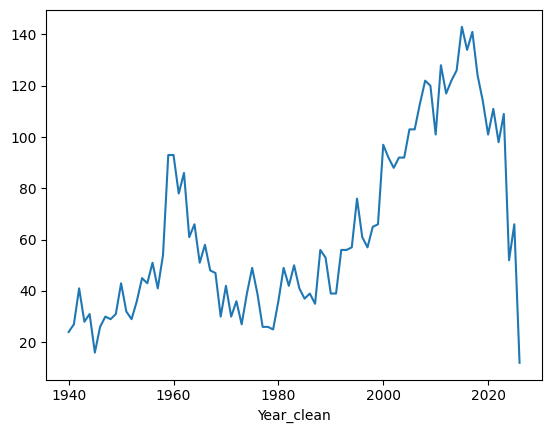

In [54]:
sharks_since_1940["Year_clean"].value_counts().sort_index().plot()

In [55]:
sharks["Age"].head(10)
sharks["Age"].dtype

dtype('O')

In [56]:
sharks["Age_clean"] = pd.to_numeric(sharks["Age"], errors="coerce")

In [57]:
sharks["Age_clean"].describe()

,Age_clean
count,3925.000000
mean,28.171975
std,14.676367
min,1.000000
25%,17.000000
50%,24.000000
75%,37.000000
max,87.000000


<Axes: ylabel='Frequency'>

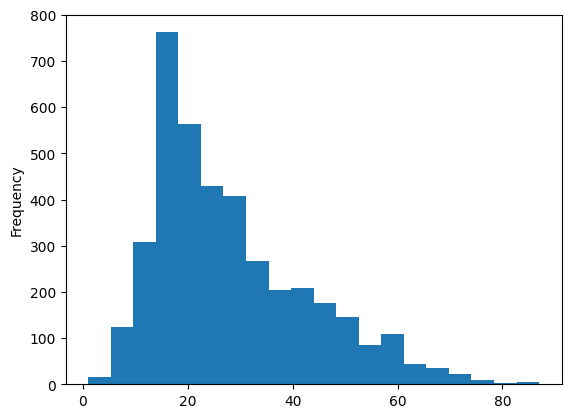

In [58]:
sharks["Age_clean"].dropna().plot(kind="hist", bins=20)

In [59]:
sharks["Type"].value_counts(dropna=False)


,count
Type,
Unprovoked,5225
Provoked,642
Invalid,552
Watercraft,355
Sea Disaster,242
Questionable,26
NaN,18
Boat,7
Provoked,2


In [63]:
sharks["Type_clean"] = sharks["Type"].replace({
    "Provoked": "Provoked",
    "Unprovoked": "Unprovoked"
})


In [61]:
sharks["Type_clean"] = sharks["Type_clean"].fillna("Unknown")


In [62]:
sharks["Type_clean"].value_counts()


,count
Type_clean,
Unprovoked,5225
Provoked,642
Invalid,552
Watercraft,355
Sea Disaster,242
Questionable,26
Unknown,18
Boat,7
Provoked,2


In [64]:
sharks["Type_clean"].value_counts()


,count
Type_clean,
Unprovoked,5225
Provoked,642
Invalid,552
Watercraft,355
Sea Disaster,242
Questionable,26
Boat,7
Provoked,2
unprovoked,1


In [65]:
sharks["Type_clean"] = sharks["Type"].str.strip().str.capitalize()


In [66]:
sharks["Type_clean"] = sharks["Type_clean"].where(
    sharks["Type_clean"].isin(["Provoked", "Unprovoked"]),
    "Unknown"
)

In [67]:
sharks["Type_clean"].value_counts()


,count
Type_clean,
Unprovoked,5226
Unknown,1204
Provoked,644


In [68]:
sharks["Fatal Y/N"].value_counts(dropna=False)


,count
Fatal Y/N,
N,4933
Y,1488
NaN,561
UNKNOWN,71
N,7
F,5
M,3
Nq,1
n,1


In [69]:
sharks["Fatal_clean"] = sharks["Fatal Y/N"].str.strip().str.upper()


In [70]:
sharks["Fatal_clean"] = sharks["Fatal_clean"].where(
    sharks["Fatal_clean"].isin(["Y", "N"]),
    "Unknown"
)


In [71]:
sharks["Fatal_clean"].value_counts()


,count
Fatal_clean,
N,4942
Y,1489
Unknown,643


In [72]:
pd.crosstab(
    sharks["Type_clean"],
    sharks["Fatal_clean"],
    normalize="index"
)


Fatal_clean,N,Unknown,Y
Type_clean,,,
Provoked,0.953416,0.013975,0.032609
Unknown,0.372924,0.460963,0.166113
Unprovoked,0.742250,0.015117,0.242633


**Q3.** Open the "tidy_data.pdf" document available in `https://github.com/ds4e/wrangling`, which is a paper called *Tidy Data* by Hadley Wickham.

  1. Read the abstract. What is this paper about?

  The paper argues that many difficulties in data analysis come from poor data structure rather than from modeling or statistical methods. Wickham introduces the concept of tidy data and proposes a simple, consistent way to organize datasets so they are easier to manipulate, visualize, and analyze.

  2. Read the introduction. What is the "tidy data standard" intended to accomplish?

  The tidy data standard is meant to reduce friction in data analysis by providing a common structure for datasets. By organizing data so that variables, observations, and values are clearly defined and consistently placed, the standard makes data cleaning more systematic and allows analysts to spend less time reshaping data and more time analyzing it.

  3. Read the intro to section 2. What does this sentence mean: "Like families, tidy datasets are all alike but every messy dataset is messy in its own way." What does this sentence mean: "For a given dataset, it’s usually easy to figure out what are observations and what are variables, but it is surprisingly difficult to precisely define variables and observations in general."

  The statement “Like families, tidy datasets are all alike but every messy dataset is messy in its own way” means that tidy datasets follow a shared structure, while messy datasets can be disorganized in many different and unpredictable forms. The follow-up sentence emphasizes that while it is often easy to roughly identify what the variables and observations are in a dataset, it is much harder to define them precisely and consistently. This lack of precision is what leads to messy data structures that complicate analysis.

  4. Read Section 2.2. How does Wickham define values, variables, and observations?

  Values as the actual measurements or entries in the dataset. Variables as the attributes being measured (what is recorded). Observations as a single unit across all variables (what the measurements describe).

  5. How is "Tidy Data" defined in section 2.3?
  
  Wickham defines tidy data using three rules: each variable must have its own column, each observation must have its own row, and each type of observational unit must form its own table. When these rules are followed, data become easier to transform, visualize, and model.

  6. Read the intro to Section 3 and Section 3.1. What are the 5 most common problems with messy datasets? Why are the data in Table 4 messy? What is "melting" a dataset?

  Wickham identifies five common problems with messy datasets: column headers that contain values instead of variable names, multiple variables stored in a single column, variables stored in both rows and columns, multiple types of observational units combined in one table, and a single observational unit split across multiple tables. Table 4 is messy because it violates these tidy data principles, particularly by embedding values in column headers and mixing multiple variables within the same structure, which makes it difficult to clearly identify variables and observations and complicates analysis.

  7. Why, specifically, is table 11 messy but table 12 tidy and "molten"?

  Table 11 is messy because it spreads observations across multiple columns and embeds variable names as values, making the structure difficult to analyze. Table 12 is tidy and “molten” because the data have been reshaped into a long format where each variable has its own column and each observation has its own row. This molten structure follows tidy data principles and supports more flexible analysis.

**Q4.** This question looks at financial transfers from international actors to American universities. In particular, from which countries and giftors are the gifts coming from, and to which institutions are they going?

For this question, `.groupby([vars]).count()` and `.groupby([vars]).sum()` will be especially useful to tally the number of occurrences and sum the values of those occurrences.

1. Load the `ForeignGifts_edu.csv` dataset.
2. For `Foreign Gift Amount`, create a histogram and describe the variable. Describe your findings.
3. For `Gift Type`, create a histogram or value counts table. What proportion of the gifts are contracts, real estate, and monetary gifts?
4. What are the top 15 countries in terms of the number of gifts? What are the top 15 countries in terms of the amount given?
5. What are the top 15 institutions in terms of the total amount of money they receive? Make a histogram of the total amount received by all institutions.
6. Which giftors provide the most money, in total?

**Q5.** This question provides some practice doing exploratory data analysis and visualization.

We'll use the `college_completion.csv` dataset from the US Department of Education. The "relevant" variables for this question are:
  - `level` - Level of institution (4-year, 2-year)
  - `aid_value` - The average amount of student aid going to undergraduate recipients
  - `control` - Public, Private not-for-profit, Private for-profit
  - `grad_100_value` - percentage of first-time, full-time, degree-seeking undergraduates who complete a degree or certificate program within 100 percent of expected time (bachelor's-seeking group at 4-year institutions)

1. Load the `college_completion.csv` data with Pandas.
2. How many observations and variables are in the data? Use `.head()` to examine the first few rows of data.
3. Cross tabulate `control` and `level`. Describe the patterns you see in words.
4. For `grad_100_value`, create a kernel density plot and describe table. Now condition on `control`, and produce a kernel density plot and describe tables for each type of institutional control. Which type of institution appear to have the most favorable graduation rates?
5. Make a scatterplot of `grad_100_value` by `aid_value`, and compute the covariance and correlation between the two variables. Describe what you see. Now make the same plot and statistics, but conditioning on `control`. Describe what you see. For which kinds of institutions does aid seem to vary positively with graduation rates?

**Q6.** In class, we talked about how to compute the sample mean of a variable $X$,
$$
m(X) = \dfrac{1}{N} \sum_{i=1}^N x_i
$$
and sample covariance of two variables $X$ and $Y$,
$$
\text{cov}(X,Y) = \dfrac{1}{N} \sum_{i=1}^N (x_i - m(X))(y_i - m(Y))).
$$
Recall, the sample variance of $X$ is
$$
s^2 = \dfrac{1}{N} \sum_{i=1}^N (x_i - m(X))^2.
$$
It can be very helpful to understand some basic properties of these statistics. If you want to write your calculations on a piece of paper, take a photo, and upload that to your GitHub repo, that's probably easiest.

We're going to look at **linear transformations** of $X$, $Y = a + bX$. So we take each value of $X$, $x_i$, and transform it as $y_i = a + b x_i$.

1. Show that $m(a + bX) = a+b \times m(X)$.
2. Show that $ \text{cov}(X,X) = s^2$.
3. Show that $\text{cov}(X,a+bY) = b \times \text{cov}(X,Y)$
4. Show that $\text{cov}(a+bX,a+bY) = b^2 \text{cov}(X,Y) $. Notice, this also means that $\text{cov}(bX, bX) = b^2 s^2$.
5. Suppose $b>0$ and let the median of $X$ be $\text{med}(X)$. Is it true that the median of $a+bX$ is equal to $a + b \times \text{med}(X)$? Is the IQR of $a + bX$ equal to $a + b \times \text{IQR}(X)$?
6. Show by example that the means of $X^2$ and $\sqrt{X}$ are generally not $(m(X))^2$ and $\sqrt{m(X)}$. So, the results we derived above really depend on the linearity of the transformation $Y = a + bX$, and transformations like $Y = X^2$ or $Y = \sqrt{X}$ will not behave in a similar way.

**Q7.** This question provides some practice doing exploratory data analysis and visualization.

We'll use the `ames_prices.csv` dataset. The "relevant" variables for this question are:
  - `price` - Sale price value of the house
  - `Bldg.Type` - Building type of the house (single family home, end-of-unit townhome, duplex, interior townhome, two-family conversion)

1. Load the `college_completion.csv` data with Pandas.
2. Make a kernel density plot of price and compute a describe table. Now, make a kernel density plot of price conditional on building type, and use `.groupby()` to make a describe type for each type of building. Which building types are the most expensive, on average? Which have the highest variance in transaction prices?
3. Make an ECDF plot of price, and compute the sample minimum, .25 quantile, median, .75 quantile, and sample maximum (i.e. a 5-number summary).
4. Make a boxplot of price. Are there outliers? Make a boxplot of price conditional on building type. What patterns do you see?
5. Make a dummy variable indicating that an observation is an outlier.
6. Winsorize the price variable, and compute a new kernel density plot and describe table. How do the results change?